## Vehicle Detection Project

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

### Read data

#### Data exploration

In [1]:
import os
import glob

basedir = 'dataset/vehicles_smallset/'
image_types = os.listdir(basedir)
cars = []
for imtype in image_types:
    cars.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of vehicle images found: ', len(cars))
with open('cars.txt', 'w') as f:
    for fn in cars:
        f.write(fn+'/n')
        
basedir = 'dataset/non-vehicles_smallset/'
image_types = os.listdir(basedir)
notcars = []
for imtype in image_types:
    notcars.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of non-vehicle images found: ', len(notcars))
with open('notcars.txt', 'w') as f:
    for fn in notcars:
        f.write(fn+'/n')

Number of vehicle images found:  1196
Number of non-vehicle images found:  1125


In [2]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.feature import hog
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
# NOTE: the last import is only valid for scikit-learn version >= 0.18
# for scikit-learn <= 0.18 use:
# from sklearn.cross_validation import train_test_split

#%matplotlib qt
%matplotlib inline

## Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier

#### Spatial Binning of Color

In [3]:
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel() 
    color2 = cv2.resize(img[:,:,1], size).ravel() 
    color3 = cv2.resize(img[:,:,2], size).ravel() 
    return np.hstack((color1, color2, color3))

#### Histograms of Color

In [4]:
def color_hist(img, nbins=32):     # bins_range=(0, 256)
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    return hist_features

#### Histogram of Oriented Gradients

In [5]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis == True:
        hog_features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell), cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, visualise=vis, feature_vector=feature_vec)
        return hog_features, hog_image
    else:      
        hog_features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell), cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, visualise=vis, feature_vector=feature_vec)
        return hog_features

#### Combine Features

In [6]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32), hist_bins=32, orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0, spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      
            
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

###### Sliding windows

In [7]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

#### Draw boxes

In [8]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    draw_img = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(draw_img, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return draw_img

#### Single Image Features

In [9]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def single_img_features(image, color_space='RGB', spatial_size=(32, 32), hist_bins=32, orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0, spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):
    # Create a list to append feature vectors to
    img_features = []
    # apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(image)      

    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        img_features.append(spatial_features)
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        img_features.append(hist_features)
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True))
            hog_features = np.concatenate(hog_features)
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        img_features.append(hog_features)

    # Return concatenated array of features
    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)

##### Search windows

In [10]:
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', spatial_size=(32, 32), hist_bins=32, hist_range=(0, 256), orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0, spatial_feat=True, hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows    

In [11]:
def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])

In [12]:
# Choose random car / not-car indices    
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

# Define feature parameters
color_space = 'RGB'
orient = 6
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0
spatial_size = (16, 16)
hist_bins = 16
spatial_feat = True
hist_feat = True
hog_feat = True

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)    

notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)    



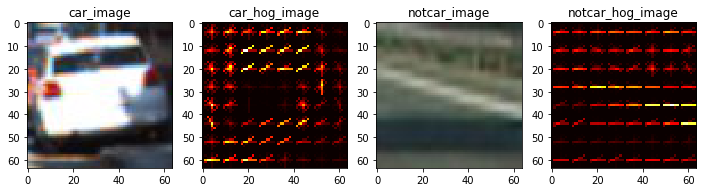

In [13]:
images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car_image', 'car_hog_image', 'notcar_image', 'notcar_hog_image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)

#### Define and train the classifier

In [14]:
# Define feature parameters
color_space = 'YCrCb'
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'
spatial_size = (16, 16)
hist_bins = 16
spatial_feat = True
hist_feat = True
hog_feat = True

t=time.time()
n_samples = 1000
random_idxs = np.random.randint(0,len(notcars), n_samples)
test_cars = np.array(cars)[random_idxs]
test_notcars =  np.array(notcars)[random_idxs]

car_features = extract_features(test_cars, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)    

notcar_features = extract_features(test_notcars, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)    

print(time.time()-t, 'Seconds to compute features...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


39.992395639419556 Seconds to compute features...


##### Shuffle and split training and test dataset

In [15]:
rand_state = np.random.randint(0,100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.1, random_state=rand_state)

In [16]:
print('Using:', orient, 'orientations,', pix_per_cell, 'pixels per cell,', cell_per_block, 'cells per block,', hist_bins, 'histogram bins, and', spatial_size, 'spatial sampling')
print('Feature vector length:', len(X_train[0]))

Using: 9 orientations, 8 pixels per cell, 2 cells per block, 16 histogram bins, and (16, 16) spatial sampling
Feature vector length: 6108


In [17]:
# Use a linear SVC
svc = LinearSVC()
# Check the training time for the SVC
t = time.time()
svc.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

11.38 Seconds to train SVC...
Test Accuracy of SVC =  1.0


##### Test on images

0.3263096809387207 seconds to process one image searching 30 windows
0.3042902946472168 seconds to process one image searching 30 windows
0.28527307510375977 seconds to process one image searching 30 windows
0.31530261039733887 seconds to process one image searching 30 windows
0.299288272857666 seconds to process one image searching 30 windows
0.3253161907196045 seconds to process one image searching 30 windows


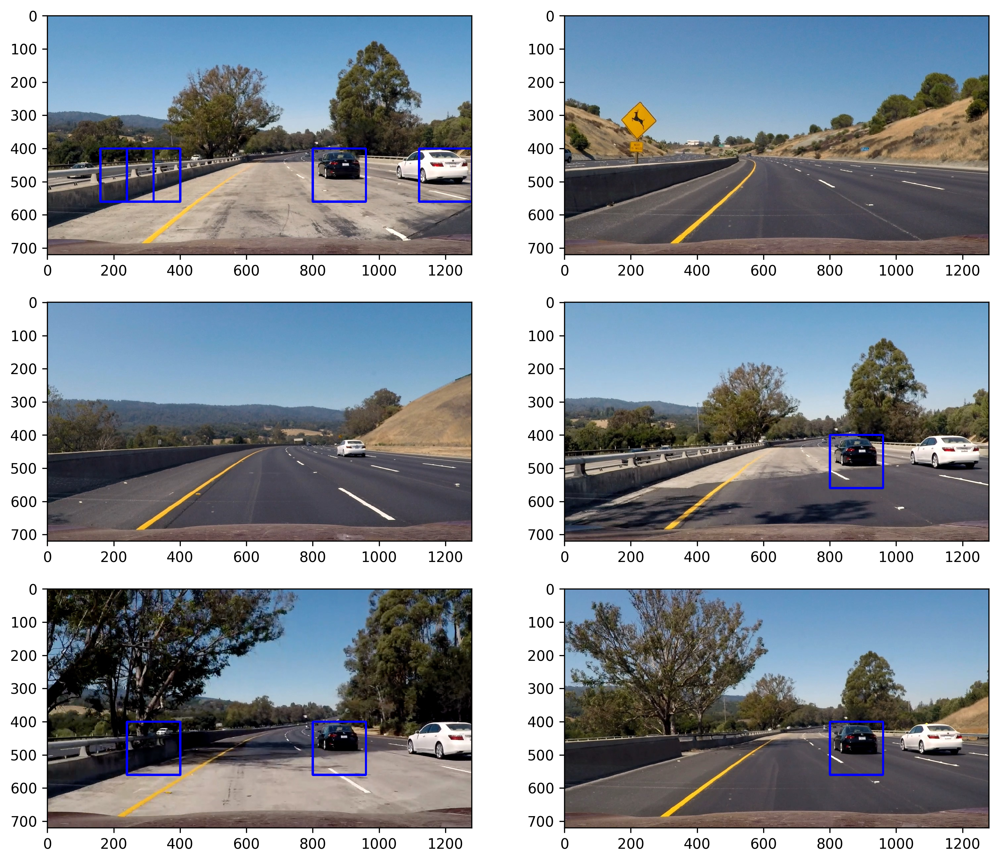

In [21]:
searchpath = 'test_images/test*'
example_images = glob.glob(searchpath) 
images = []
titles = []
y_start_stop = [400, 656] # Min and max in y to search in slide_window()
overlap = 0.5
for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    #img = img.astype(np.float32)/255
    #plt.imshow(img)
    #print(np.min(img), np.max(img))
    #y_start_stop = [int(draw_img.shape[0]/2), int(draw_img.shape[0])]

    
    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop, xy_window=(160, 160), xy_overlap=(overlap, overlap))
    
    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space, spatial_size=spatial_size, hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)                       

    window_img = draw_boxes(draw_img, hot_windows, color=(0, 0, 255), thick=6)                    

    images.append(window_img)
    titles.append(' ')
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')

fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 5, 2, images, titles)

##### Color conversion

In [25]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

##### Multi-scale windows

2.0149075984954834 seconds to run, total windows =  912
2.05495023727417 seconds to run, total windows =  912
1.992889165878296 seconds to run, total windows =  912
2.0499424934387207 seconds to run, total windows =  912
2.0119099617004395 seconds to run, total windows =  912
1.9898886680603027 seconds to run, total windows =  912


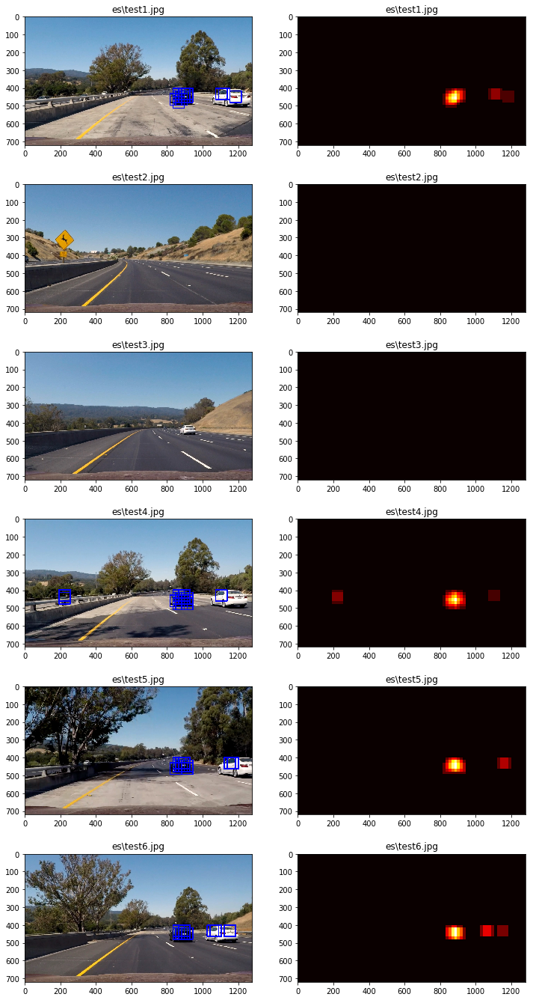

In [49]:
out_images = []
out_maps = []
out_titles = []
out_boxes = []
# Consider a narrower swath in y
ystart = 400
ystop = 656
scale = 1.  
# Iterate over test images
for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    # Make a heatmap of zeros
    heatmap = np.zeros_like(img[:,:,0])
    #img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))  
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient * cell_per_block**2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2 # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    # This will give you a series of HOG window extracts
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            #Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell
            
            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64, 64))
            
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1

    print(time.time()-t, 'seconds to run, total windows = ', count)
    
    out_images.append(draw_img)
    
    out_titles.append(img_src[-12:])
    out_titles.append(img_src[-12:])
    #heatmap = 255 * heatmap / np.max(heatmap)
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)
    
fig = plt.figure(figsize=(12,24))
visualize(fig, 9, 2, out_images, out_titles)

#### Wrap into a function

In [50]:
# Iterate over test images
def find_cars(img, scale):
    
    draw_img = np.copy(img)
    # Make a heatmap of zeros
    heatmap = np.zeros_like(img[:,:,0])
    #img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))  
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient * cell_per_block**2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2 # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    # This will give you a series of HOG window extracts
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            #Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos * pix_per_cell
            ytop = ypos * pix_per_cell
            
            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64, 64))
            
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1

    return draw_img, heatmap

In [51]:
from scipy.ndimage.measurements import label

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

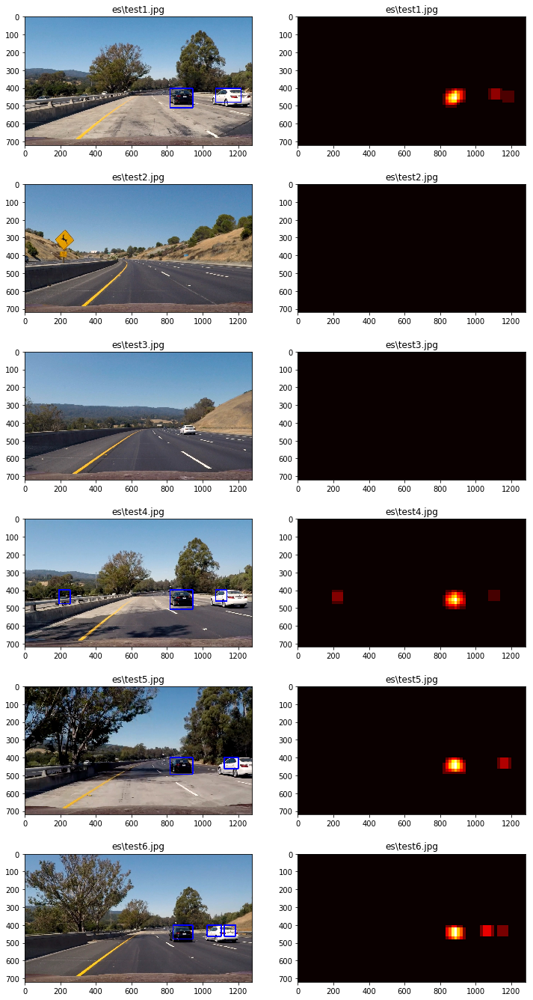

In [53]:
out_images = []
out_maps = []
#out_titles = []
#out_boxes = []
# Consider a narrower swath in y
ystart = 400
ystop = 656
scale = 1.
# Iterate over test images
for img_src in example_images:
    img = mpimg.imread(img_src)
    out_img, heatmap = find_cars(img, scale)
    labels = label(heatmap)
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    out_images.append(draw_img)
    out_images.append(heatmap)
    
fig = plt.figure(figsize=(12,24))
visualize(fig, 9, 2, out_images, out_titles)

## Test on videos

In [54]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [55]:
def process_video(image):
    out_img, heatmap = find_cars(image, scale)
    labels = label(heatmap)
    # Draw bounding boxes on a copy of the image
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    return draw_img

In [57]:
project_video_output = 'test_video_output.mp4'
#clip1 = VideoFileClip("project_video.mp4")
clip1 = VideoFileClip("test_video.mp4")
project_video_clip = clip1.fl_image(process_video)
%time project_video_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video test_video_output.mp4
[MoviePy] Writing video test_video_output.mp4


 97%|████████████████████████████████████████▉ | 38/39 [01:52<00:03,  3.48s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_output.mp4 

Wall time: 1min 56s


In [58]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))

In [ ]:
# Balance dataset by equalizing the amount of data in both lists
amt_to_be_added = len(cars) - len(notcars)
if (amt_to_be_added > 0):
    # add to notcars
    unbalanced_list = notcars
else:
    # add to cars
    unbalanced_list = cars
    
additional = []
idxs = []
idxs = [np.random.randint(1, len(unbalanced_list)) for _ in range(amt_to_be_added)]
for idx in idxs:
    additional.append(unbalanced_list[idx])
unbalanced_list.extend(additional)
print(amt_to_be_added)
print(len(unbalanced_list))
print(len(cars))
print(len(notcars))

"""
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(orig_image)
ax1.set_title('Original Distorted Image', fontsize=20)
ax2.imshow(box_image)
ax2.set_title('Undistorted Image', fontsize=20)
"""


## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [ ]:
# Get objpoints, imgpoints
def calibrate_camera(images):
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    for idx,fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            #cv2.imshow(fname,img)
            write_name = '../output_images/chessboard_corners/' + str(idx) + '.jpg' 
            #cv2.imwrite(write_name, img)      
            cv2.waitKey(100)

        cv2.destroyAllWindows()
    return objpoints, imgpoints

# Get camera calibration matrix and distortion coefficients
def distort_coeffs(img, objpoints, imgpoints):
    img = mpimg.imread(img)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    return mtx, dist

In [ ]:
# Undistort image function
def cal_undistort(img, mtx, dist):
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    return undst

In [ ]:
# Test undistortion on a chessboard images
calibration_images = glob.glob('../camera_cal/calibration*.jpg')
objpoints, imgpoints = calibrate_camera(calibration_images)
chessboard = '../camera_cal/calibration1.jpg'
mtx, dist = distort_coeffs(chessboard, objpoints, imgpoints)

chessboard_images = glob.glob('../camera_cal/calibration*.jpg')

for idx,fname in enumerate(chessboard_images):
    chessboard_img = cv2.imread(fname)
    chessboard_undst = cal_undistort(chessboard_img, mtx, dist)
    write_name = '../output_images/undistorted_chessboards/' + str(idx) + '.jpg'
    #cv2.imwrite(write_name, chessboard_undst)      

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(chessboard_img)
    ax1.set_title(fname, fontsize=12)
    ax2.imshow(chessboard_undst)
    ax2.set_title(write_name, fontsize=12)

## Apply a distortion correction to raw images.

In [ ]:
test_images = glob.glob('../test_images/test*.jpg')
#test_images = glob.glob('../test_images/straight_lines*.jpg')

for idx,test_image in enumerate(test_images):
    dist_img = mpimg.imread(test_image)
    test_undst = cal_undistort(dist_img, mtx, dist)
    
    write_name = '../output_images/undistorted_test_images/test' + str(idx) + '.jpg'
    write_name = '../output_images/undistorted_test_images/straight_lines' + str(idx) + '.jpg'
    #cv2.imwrite(write_name, test_undst)      
    
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(dist_img)
    ax1.set_title('Original Distorted Image', fontsize=20)
    ax2.imshow(test_undst)
    ax2.set_title('Undistorted Image', fontsize=20)

## Use color transforms, gradients, etc., to create a thresholded binary image.

### Pre-process images
### Undistort, Grayscale, derive Sobel operators

In [ ]:
def process_image(img, sobel_kernel=3):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    abs_sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    return abs_sobelx, abs_sobely

## Gradients

In [ ]:
# Scaled Sobel threshold function
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    abs_sobelx, abs_sobely = process_image(img, sobel_kernel)
    if orient == 'x': abs_sobel = abs_sobelx
    if orient == 'y': abs_sobel = abs_sobely
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return grad_binary
    
#grad_binary = abs_sobel_thresh(sample_img, orient='x', sobel_kernel=3, thresh=(50,150))
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(sample_img)
#ax1.set_title('Original Image', fontsize=20)
#ax2.imshow(grad_binary, cmap='gray')
#ax2.set_title('Thresholded Gradient', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
# Gradient magnitude threshold function
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    abs_sobelx, abs_sobely = process_image(img, sobel_kernel)
    magnitude = np.sqrt(abs_sobelx**2 + abs_sobely**2)
    scaled_sobel = np.uint8(255 * magnitude / np.max(magnitude))
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return mag_binary
    
#mag_binary = mag_thresh(sample_img, sobel_kernel=9, mag_thresh=(40, 140))
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(sample_img)
#ax1.set_title('Original Image', fontsize=20)
#ax2.imshow(mag_binary, cmap='gray')
#ax2.set_title('Thresholded Magnitude', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
# Gradient direction threshold function
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    abs_sobelx, abs_sobely = process_image(img, sobel_kernel)
    direction = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(direction)
    dir_binary[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    return dir_binary
    
#dir_binary = dir_threshold(sample_img, sobel_kernel=15, thresh=(0.8, 1.2))
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(sample_img)
#ax1.set_title('Original Image', fontsize=20)
#ax2.imshow(dir_binary, cmap='gray')
#ax2.set_title('Thresholded Grad. Dir.', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Colorspace

In [ ]:
# Grayscale threshold function
def gray_threshold(img, thresh=(0, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray_binary = np.zeros_like(gray)
    gray_binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return gray_binary

#gray_binary = gray_threshold(sample_img, thresh = (205, 255))
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(cv2.cvtColor(sample_img, cv2.COLOR_RGB2GRAY), cmap='gray')
#ax1.set_title('Gray Image', fontsize=20)
#ax2.imshow(gray_binary, cmap='gray')
#ax2.set_title('Thresholded Gray', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
# RGB channels threshold function
def rgb_threshold(img, channel='r', thresh=(0, 255)):
    R = img[:,:,0]
    G = img[:,:,1]
    B = img[:,:,2]
    if channel == 'r': ch = R
    if channel == 'g': ch = G
    if channel == 'b': ch = B
    rgb_binary = np.zeros_like(ch)
    rgb_binary[(ch > thresh[0]) & (ch <= thresh[1])] = 1
    return rgb_binary

#rgb_binary = rgb_threshold(sample_img, channel='r', thresh=(225, 255))
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(sample_img)
#ax1.set_title('Original Image', fontsize=20)
#ax2.imshow(rgb_binary, cmap='gray')
#ax2.set_title('Thresholded Red', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
# HLS colorspace threshold function
def hls_threshold(img, channel='s', thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    if channel == 'h': ch = H
    if channel == 'l': ch = L
    if channel == 's': ch = S
    binary = np.zeros_like(ch)
    binary[(ch > thresh[0]) & (ch <= thresh[1])] = 1
    return binary

#hls_binary = hls_threshold(sample_img, channel='s', thresh=(170, 255))
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(sample_img)
#ax1.set_title('Original Image', fontsize=20)
#ax2.imshow(hls_binary, cmap='gray')
#ax2.set_title('Thresholded S Channel', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Apply and combine thresholds

In [ ]:
def threshold_combo(img):
    img = np.copy(img) 

    # Threshold gray 
    gr_binary = gray_threshold(img, thresh = (205, 255))

    # Threshold S channel
    s_binary = hls_threshold(img, channel='s', thresh=(170, 255))

    # Threshold L channel
    l_binary = hls_threshold(img, channel='l', thresh=(200, 255))

    # Threshold R channel
    r_binary = rgb_threshold(img, channel='r', thresh=(225, 255))
    
    # Combined color threshold
    slr_binary = np.zeros_like(s_binary)
    slr_binary[ [(s_binary == 1) | (l_binary == 1)  | (r_binary == 1)] ] = 1

    # Threshold x gradient
    sxbinary = abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(20, 100))
    
    # Threshold color channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, slr_binary))

    # Combined binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(slr_binary == 1) | (sxbinary == 1) | (gr_binary == 1)] = 1

    return color_binary, combined_binary
    
#color_binary, combined_binary = threshold_combo(sample_img)
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(color_binary)
#ax1.set_title('Color Binary', fontsize=20)
#ax2.imshow(combined_binary, cmap='gray')
#ax2.set_title('Combined Binary', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Apply a perspective transform to rectify binary image ("birds-eye view").

In [ ]:
def get_shapes(img):
    img_size = (img.shape[1], img.shape[0])
    # left,top --> left,bottom --> right,bottom --> right, top
    top = img_size[1] * 0.62
    bottom = img_size[1]
    left_top = img_size[0] * 0.47
    right_top = img_size[0] * 0.53
    left_bottom = img_size[0] * 0.155
    right_bottom = img_size[0] * 0.87
    src = np.float32 ([[left_top, top], [left_bottom,bottom], [right_bottom, bottom], [right_top, top]])
    dst = np.float32([[img_size[0] /4, 0], [img_size[0] /4, img_size[1]], [img_size[0] * 3/4, img_size[1] ], [img_size[0] * 3/4, 0]])
    vertices = np.array([[(img_size[0] * 0.05, img_size[1]), (img_size[0] * 10/23, img_size[1] *3/5), (img_size[0] * 13/23, img_size[1] *3/5), (img_size[0] * 0.95, img_size[1])]], dtype=np.int32)
    return src, dst, vertices

#test_image = '../test_images/test1.jpg'
#test_image = '../test_images/straight_lines2.jpg'
#dist_img = mpimg.imread(test_image)
#undist_sample_img = cal_undistort(dist_img, mtx, dist)
#src, dst, vertices = get_shapes(undist_sample_img)
# print(src)
# print(dst)
# print(vertices)

In [ ]:
# Apply region of interest to focus on lanes
def region_of_interest(img, vertices):
    mask = np.zeros_like(img)   
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

#undst_sample_img = region_of_interest(undist_img, vertices)
#plt.imshow(undst_sample_img)

In [ ]:
def corners_unwarp(img, src, dst):
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    Minv = cv2.getPerspectiveTransform(dst,src)
    return warped, M, Minv

# works with undst_sample_img, color_binary, combined_binary
#binary_warped, perspective_M, Minv = corners_unwarp(combined_binary, src, dst)
#warped, perspective_M, Minv = corners_unwarp(undist_sample_img, src, dst)
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(undist_sample_img, cmap='gray')
#ax1.set_title('Undistorted Sample Image', fontsize=20)
#ax2.imshow(warped, cmap='gray')
#ax2.set_title('Undistorted Warped Image', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
# check src coordinates
def draw_lines(img, src):
    img = np.copy(img)
    src = src.astype(np.int32)
    src = src.reshape((-1,1,2))
    img = cv2.polylines(img,[src], True, (0,255,0), 5)
    return img

#region_src = draw_lines(undist_sample_img, src)
#plt.imshow(region_src)
#src = src.astype(np.int32)

In [ ]:
# check dst coordinates
def draw_lines(img, dst):
    img = np.copy(img)
    dst = dst.astype(np.int32)
    dst = dst.reshape((-1,1,2))
    img = cv2.polylines(img,[dst], True, (0,255,0), 5)
    return img

#region = draw_lines(warped, dst)
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(region_src)
#ax1.set_title('Undistorted Sample Image with src', fontsize=20)
#ax2.imshow(region)
#ax2.set_title('Undistorted Warped Image with dst', fontsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Detect lane pixels and fit to find the lane boundary.

In [ ]:
# Lane detecting function that starts with a histogram and uses sliding window
def detect_lane_boundary(binary_warped):
    # Histogram version for detecting lane pixels 
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Peak of the left and right halves of the histogram = starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Number of sliding windows
    nwindows = 9
    # Height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Width of the windows +/- margin
    margin = 100
    # Minimum number of pixels found to recenter window
    minpix = 50
    # Left and right lane pixel indices lists
    left_lane_inds = []
    right_lane_inds = []

    for window in range(nwindows):
        # Window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 

        # Nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # Recenter next window on their mean position if > minpix pixels
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Second order polynomial of each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Visualization
    # x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Raw data
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    #plt.imshow(out_img)

    # Plot lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    #plt.xlim(0, 1280)
    #plt.ylim(720, 0)
    
    return out_img, leftx, rightx, lefty, righty, left_fit, right_fit, left_fitx, right_fitx, ploty

#out_img, leftx, rightx, lefty, righty, left_fit, right_fit, left_fitx, right_fitx, ploty = detect_lane_boundary(binary_warped)

In [ ]:
# Lane detecting function that uses previously determined fit values
# binary_warped = combined_binary for new image
# Nonzero pixels in x and y within new window
def detect_lane_boundary2(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100

    # Use the polynomial derived from the old image 
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Second order polynomial for left and right line pixel positions
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # out_img = an image to draw on 
    # window_img = an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)

    # Left and right line pixels in out_img
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    output = cv2.addWeighted(out_img, 1., window_img, 0.3, 0)
    #plt.imshow(result)
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    #plt.xlim(0, 1280)
    #plt.ylim(720, 0)
    
    return output, leftx, rightx, lefty, righty, left_fit, right_fit, left_fitx, right_fitx, ploty

#output, leftx, rightx, lefty, righty, left_fit, right_fit, left_fitx, right_fitx, ploty = detect_lane_boundary2(binary_warped, left_fit, right_fit)

In [ ]:
# Lane detection function using convolutions (didn't use it but included it here for future reference)
# Read in a thresholded image
def window_mask(width, height, img_ref, center, level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def detect_lane_boundary3(binary_warped):
    warped = binary_warped
    # window settings
    window_width = 50 
    window_height = 80 # Break image into 9 vertical layers since image height is 720
    margin = 100 # How much to slide left and right for searching

    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    return output

    # Display the final results
    #plt.imshow(output)
    #plt.title('window fitting results')
    #plt.show()


### Apply smoothing average

In [ ]:
# Selects and saves only data from good images and outputs smoothed average values
def detect_smoothed_lanes(binary_warped, left_lane, right_lane, iterations=10):
    # If first image or no previous image and detected = false, detect_lane_boundary will be used
    if ((len(left_lane.previous_fit) <= 0  | len(right_lane.previous_fit) <= 0) | (left_lane.detected == False  & right_lane.detected == False )):
        output, leftx, rightx, lefty, righty, left_fit, right_fit, left_fitx, right_fitx, ploty = detect_lane_boundary(binary_warped)
        print("detect_lane_boundary", left_fit)
        print("detect_lane_boundary", right_fit)
    else:
        print("detect_lane_boundary2", left_lane.previous_fit)
        print("detect_lane_boundary2", right_lane.previous_fit)
        output, leftx, rightx, lefty, righty, left_fit, right_fit, left_fitx, right_fitx, ploty = detect_lane_boundary2(binary_warped, left_lane.previous_fit, right_lane.previous_fit)
    #Determine the curvature of the lane and vehicle position with respect to center.
    left_curverad, right_curverad, curverad_equal = lane_curvature(ploty, leftx, lefty, rightx, righty)
    left_basepos, right_basepos, lanespace_equal = lane_space(left_fitx, right_fitx)

    # If good frame, include values in computing best average values for n iterations
    current_lane_detected = is_lane_detected(lanespace_equal, curverad_equal)

    if ((current_lane_detected == True) | (right_lane.iterations <= 0) | (left_lane.iterations <= 0)):
        # Didn't need to include all x & y values but heck
        left_lane = init_left_lane(left_lane, left_fitx, lefty, left_fit, left_curverad, left_basepos, current_lane_detected)
        right_lane = init_right_lane(right_lane, right_fitx, righty, right_fit, right_curverad, right_basepos, current_lane_detected)
    else: 
        # set to previous good fit value
        left_lane = left_lane.reset_left_lane()
        right_lane = right_lane.reset_right_lane()
        
    # Whether good or bad frame, always use best values 
    right_fitx, right_fit, right_curverad, right_basepos = right_lane.use_best_lane_values(iterations=10)
    left_fitx, left_fit, left_curverad, left_basepos = left_lane.use_best_lane_values(iterations=10)
    lane_center = (left_basepos + right_basepos) / 2

    return left_fitx, right_fitx, left_curverad, right_curverad, lane_center, ploty

## Determine the curvature of the lane and vehicle position with respect to center.

In [ ]:
def lane_curvature(ploty, leftx, lefty, rightx, righty):
    y_eval = np.max(ploty)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    # New radii of curvature in meters
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    left_curverad = round(left_curverad, 2)  
    right_curverad = round(right_curverad, 2) 
    
    curverad_equal = False
    if (((left_curverad <= 0) & (right_curverad <= 0)) | ((left_curverad > 0) & (right_curverad > 0))):
        curverad_equal = True 

    return left_curverad, right_curverad, curverad_equal

In [ ]:
# Function to determine if the distance between lanes is consistent
def lane_space(left_fitx, right_fitx):
    left_basepos = left_fitx[-1]
    right_basepos = right_fitx[-1]
    
    # Distance between lanes at top of image
    lanespace_top = (right_fitx[0] - left_fitx[0])
    # Distance between lanes at bottom of image
    lanespace_bottom = (right_basepos - left_basepos)
    # if distance between lanes at top the same as at the bottom == good laneline
    lanespace_equal = False
    # 0.5 = acceptable difference in value
    if ( (np.absolute(lanespace_top - lanespace_bottom)) <= (0.5 / 3.7 * 700) ):
        lanespace_equal = True
        
    return left_basepos, right_basepos, lanespace_equal

In [ ]:
def is_lane_detected(lanespace_equal, curverad_equal):
    #is the lane distance equal space from top and bottom? check
    # is the left curvature and right curvature equal? too noisy, did not include 
    # is the diff between previous and current coeffs acceptable? did not include

    if (lanespace_equal == True & curverad_equal == True):
    #if (lanespace_equal == True):
        return True
    else:
        return False

## Warp the detected lane boundaries back onto the original image.

In [ ]:
# warped = binary_warped of the undst_sample_img
def reverse_transform(undst_sample_img, warped, left_fitx, right_fitx, Minv, ploty):
    # x and y values for plotting
    #ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    
    # warp_zero = an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    #color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    color_warp = warp_zero

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undst_sample_img.shape[1], undst_sample_img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undst_sample_img, 1, newwarp, 0.3, 0)
    return result

#result = reverse_transform(undst_sample_img, warped, left_fitx, right_fitx, Minv)


## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [ ]:
def show_lane(result, left_curverad, right_curverad, lane_ctr):
    # To find vehicle position
    img_ctr = result.shape[1] * 3.7 / 700 / 2
    offset = round((img_ctr - lane_ctr), 2)
    sidepos = 'right'
    if (offset < 0):
        sidepos = 'left'
        
    # To determine mean lane curvature radius
    mean_curverad = round(np.mean([left_curverad, right_curverad]), 2)

    # Text Display
    text1 = 'Mean radius of lane curvature:  ' + str(mean_curverad) + ' m' 
    org1 = (50,40)
    text2 = 'Vehicle position: ' + str(np.absolute(offset)) + ' m ' + sidepos + ' of center' 
    org2 = (50,70)

    font = cv2.FONT_HERSHEY_SIMPLEX
    scale = 0.9
    color = (255,255,255)
    thickness = 2
    cv2.putText(result, text1, org1, font, scale, color, thickness)
    cv2.putText(result, text2, org2, font, scale, color, thickness)
    
    return result

#result = show_lane(result, left_curverad, right_curverad, lane_ctr)
#plt.imshow(result)

## Line Class

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in this iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = []
        # polynomial coefficients of the last n fits of the line
        self.recent_fitted = []
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([0,0,0])]  
        #radius of curvature of the line in meters
        self.radius_of_curvature = None 
        #distance in meters of xmin from the line
        self.line_base_pos = None 
        #x values for detected line pixels
        self.allx = None  
        
        # Additional values
        #polynomial coefficients for the last fit
        self.previous_fit = []
        self.iterations = 0

        #y values for detected line pixels
        self.ally = None
        # y values of the last n fits of the line
        self.recent_yfitted = [] 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 

    def append_averages(self):
        # x values of the last n fits of the line
        self.recent_xfitted.append(self.allx) 
        # average x values of the fitted line over the last n iterations
        self.bestx = np.mean(self.recent_xfitted, axis=0)
        if (self.iterations >= 1):
            self.previous_fit = self.recent_fitted[0]
            #difference in fit coefficients between last and new fits
            self.diffs = self.previous_fit - self.current_fit
        # polynomial coefficients of the last n fits of the line
        self.recent_fitted.append([self.current_fit])
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.mean(self.recent_fitted, axis=0) 

        # y values of the last n fits of the line
        self.recent_yfitted.append(self.ally) 
        
    def use_best_lane_values(self, iterations=10):
        # previous fit at the start
        if (iterations <= 1):
            self.previous_fitnp.copy(self.current_fit)
        else:
            self.previous_fit = self.recent_fitted[0]
        # best fit to use at start of iterations
        if (len(self.recent_fitted) < iterations):
            self.iterations = len(self.recent_fitted)
        else:
            self.iterations = iterations
        # polynomial coefficients of the last n fits of the line
        self.recent_fitted = self.recent_fitted[-self.iterations:]
        # x values at the last n fits of the line
        self.recent_xfitted = self.recent_xfitted[-self.iterations:]
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.mean(self.recent_fitted, axis=0) 
        # x values averaged over the last n fits of the line
        self.bestx = np.mean(self.recent_xfitted, axis=0) 
        # output best averages
        return self.bestx, self.best_fit, self.radius_of_curvature, self.line_base_pos

    # left_fitx, left_fit, left_curverad, left_basepos = use_best_left_values(left_lane)
    
    def reset_lane(self):
        # was the line detected in the last iteration?
        self.detected = False  

In [ ]:
def init_left_lane(left_lane, left_fitx, lefty, left_fit, left_curverad, left_basepos, detected):
    # was the line detected in this iteration?
    left_lane.detected = detected
    #x values for detected line pixels
    left_lane.allx = left_fitx 
    #polynomial coefficients for the most recent fit
    left_lane.current_fit = left_fit
    #radius of curvature of the line in some units
    left_lane.radius_of_curvature = left_curverad
    #distance in meters of vehicle center from the line
    left_lane.line_base_pos = left_basepos * 3.7 / 700

    #y values for detected line pixels
    left_lane.ally = lefty

    left_lane.append_averages()
    
    return left_lane

In [ ]:
def init_right_lane(right_lane, right_fitx, righty, right_fit, right_curverad, right_basepos, detected):
    # was the line detected in this iteration?
    right_lane.detected = detected  
    #x values for detected line pixels
    right_lane.allx = right_fitx 
    #polynomial coefficients for the most recent fit
    right_lane.current_fit = right_fit
    #radius of curvature of the line in some units
    right_lane.radius_of_curvature = right_curverad
    #distance in meters of xmin from the line
    right_lane.line_base_pos = right_basepos * 3.7 / 700

    #y values for detected line pixels
    right_lane.ally = righty

    right_lane.append_averages()

    return right_lane

## Main Pipeline

In [ ]:
def pipeline(img, left_lane, right_lane):
    img = np.copy(img)

    # Apply a distortion correction to raw images.
    dist_pickle = pickle.load( open( "../output_images/wide_dist_pickle.p", "rb" ) )
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]    
    undst = cal_undistort(img, mtx, dist)
    
    # Use color transforms, gradients, etc., to create a thresholded binary image.
    color_binary, combined_binary = threshold_combo(undst)
    src, dst, vertices = get_shapes(undst)
    region_image = region_of_interest(combined_binary, vertices)
    binary_warped, perspective_M, Minv = corners_unwarp(region_image, src, dst)
    
    # Detect lane pixels and fit to find the lane boundary.
    left_fitx, right_fitx, left_curverad, right_curverad, lane_center, ploty = detect_smoothed_lanes(binary_warped, left_lane, right_lane, iterations=10)
    
    #Warp the detected lane boundaries back onto the original image.
    warped, perspective_M, Minv = corners_unwarp(undst, src, dst)
    unwarped = reverse_transform(undst, warped, left_fitx, right_fitx, Minv, ploty)
    #Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
    result = show_lane(unwarped, left_curverad, right_curverad, lane_center)
    return unwarped, result

## Test on images

In [ ]:
# Calibrate camera
calibration_images = glob.glob('../camera_cal/calibration*.jpg')
objpoints, imgpoints = calibrate_camera(calibration_images)
chessboard = '../camera_cal/calibration1.jpg'
mtx, dist = distort_coeffs(chessboard, objpoints, imgpoints)

dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "../output_images/wide_dist_pickle.p", "wb" ) )

In [ ]:
# List of test images
test_images = glob.glob('../test_images/straight_lines*.jpg')
#test_images = glob.glob('../test_images/test*.jpg')

left_lane = Line()
right_lane = Line()

# Test pipeline on images
for idx, test_image in enumerate(test_images):
    #left_lane = Line()
    #right_lane = Line()

    img_name = test_image
    test_img = mpimg.imread(img_name)
    unwarped, test_result = pipeline(test_img, left_lane, right_lane)
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(test_img)
    ax1.set_title('Original Image', fontsize=15)
    ax2.imshow(test_result)
    ax2.set_title('Pipeline Result', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    # Save images to output folder
    write_name = '../output_images/result_test_images/straight_lines' + str(idx+1) + '.jpg'
    write_name = '../output_images/result_test_images/test' + str(idx+1) + '.jpg'
    test_result = cv2.cvtColor(test_result, cv2.COLOR_RGB2BGR).astype(np.float)
    #cv2.imwrite(write_name, test_result)      

## Test on videos

In [ ]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
left_lane = Line()
right_lane = Line()

In [ ]:
def process_video(image):
    __, result = pipeline(image, left_lane, right_lane)
    return result

In [ ]:
project_video_output = '../project_video_output.mp4'
clip1 = VideoFileClip("../project_video.mp4")
project_video_clip = clip1.fl_image(process_video)
%time project_video_clip.write_videofile(project_video_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))

In [ ]:
challenge_video_output = '../challenge_video_output.mp4'
clip1 = VideoFileClip("../challenge_video.mp4")
challenge_video_clip = clip1.fl_image(process_video)
%time challenge_video_clip.write_videofile(challenge_video_output, audio=False)

In [ ]:
HTML("""
<video width="640" height="480" controls>
  <source src="{0}">
</video>
""".format(challenge_video_output))

In [ ]:
vidcap = cv2.VideoCapture('../project_video_output.mp4')
vidcap.set(cv2.CAP_PROP_POS_MSEC,23250) 
success,image = vidcap.read()
if success:
    cv2.imwrite("../project_video_frame3.jpg", image)  
    cv2.imshow("23sec",image)
    cv2.waitKey()            

### Pseudocode for detect_smoothed_lanes() and updating Line class :

* declare variables
    * input in class leftx, rightx, left_fit, right_fit, left_fitx, right_fitx, left_curverad, right_curverad
    * update in class iterations, detected
* detect the lanes, possible values to check
        * x values > 5    doesn't work
        * check number of x values    doesn't work
    * x values difference from ave < 1 std dev
        * check differences in x values
        * add x values to x values of the last n fits 
        * get ave
        * get std dev    no need
    * difference in fit coefficients between last and new fits < ???
        * check average values of fit coeffs
        * get difference between current & previous
    * lane space <> 3.7
    * difference between top & bottom lane space <> 0.5
    * difference between l curve & r curve <> ???%
    * if detected: 
        * update best_fit, bestx, recent_xfitted, recent_fitted
        * if iterations < 10: use average n values
        * if iterations = 10: use best values
        * if iterations > 10: use best values and resize best_fit, bestx, recent_xfitted, recent_fitted
    * else:
        * do not update best_fit, bestx, recent_xfitted, recent_fitted
        * if iterations < 10: use average n values
        * if iterations = 10: use best_fit
        * if iterations > 10: use best_fit
        * left_curverad, lane_ctr = init values
        * update detected        